In [1]:
using Plots, Printf, DelimitedFiles, BenchmarkTools, DelimitedFiles, Serialization, Random
include("../src/MDToolbox.jl")
using .MDToolbox

In [2]:
seed_num = 123
sigma = 7
frame_num = 200
detail = 0
seed = MersenneTwister(seed_num)

q_array = readdlm("data/quaternion/QUATERNION_LIST_576_Orient")
model_array = readpdb("data/t1r/cluster.pdb");
for iatom = 1:model_array.natom
    model_array.atomname[iatom] = model_array.resname[iatom]
end
MDToolbox.decenter!(model_array)
param_array = [AfmizeConfig(10.0 * (pi / 180),
                            r, 
                            MDToolbox.Point2D(-200, -200), 
                            MDToolbox.Point2D(200, 200), 
                            MDToolbox.Point2D(6.25, 6.25), 
                            MDToolbox.defaultParameters())
                            for r in [15]]

model_num = size(model_array, 1)
q_num = size(q_array, 1)

576

In [3]:
using BSON: @load
#@load "data/t1r/t1r.bson" C T pi_i p_all indexOfCluster tau pdb psf
@load "data/t1r/t1r.bson" T pi_i p_all

In [4]:
function rand_sample(p, seed)
  p_cum = cumsum(p) ./ sum(p)
  r = rand(seed)
  for i = 1:length(p_cum)
    if r <= p_cum[i]
      return i
    end
  end
end

function rand_generate(nframe::Int, T, pi_i, seed)
  states = zeros(typeof(nframe), nframe)

  states[1] = rand_sample(pi_i, seed)
  for iframe = 2:nframe
    states[iframe] = rand_sample(T[states[iframe-1], :], seed)
  end
  return states
end

rand_generate (generic function with 1 method)

In [5]:
state_trans = rand_generate(frame_num, T, pi_i, seed)

200-element Array{Int64,1}:
 41
 47
 41
 17
 17
 39
 24
  4
  4
  4
  4
 20
 39
  ⋮
 34
 38
  3
 35
 34
 38
  3
  3
  3
 34
 34
 16

In [6]:
transitions_num = 10
function quate_dist(q1, q2)
    return min(sum(q1 .+ q2) .^ 2, sum(q1 .- q2) .^ 2)
end

quate_T = zeros(Float64, q_num, q_num)
for i in 1:q_num
    arr = []
    for j in 1:q_num
        push!(arr, (quate_dist(q_array[i], q_array[j]), j))
    end
    sort!(arr)
    for id in 1:transitions_num
        quate_T[i, arr[id][2]] = 1 / transitions_num
    end
end
quate_trans = rand_generate(frame_num, quate_T, pi_i, seed)

200-element Array{Int64,1}:
   5
   8
 149
   5
   5
 152
  56
   5
 101
  56
 149
 101
   8
   ⋮
 104
   5
 149
 149
  53
  56
   8
   8
 152
 101
 104
 236

In [7]:
function make_rand_data(state_trans, quate_trans, seed, sigma, frame_num)
    ret = []
    for i in 1:frame_num
        model = model_array[state_trans[i], :]
        radius = 15 + randn(seed)
        quate = q_array[quate_trans[i], :]
        config = AfmizeConfig(10.0 * (pi / 180), 
                              radius, 
                              MDToolbox.Point2D(-200, -200), 
                              MDToolbox.Point2D(200, 200), 
                              MDToolbox.Point2D(6.25, 6.25), 
                              MDToolbox.defaultParameters())
        model = MDToolbox.rotate(model, quate)
        afm = MDToolbox.afmize(model, config)
        h, w = size(afm)
        afm .+= randn(seed, h, w) * sigma
        push!(ret, afm)
    end
    return ret
end

make_rand_data (generic function with 1 method)

In [8]:
@time frames = make_rand_data(state_trans, quate_trans, seed, sigma, frame_num);

  9.692103 seconds (174.84 M allocations: 4.139 GiB, 6.32% gc time)


┌ Info: Saved animation to 
│   fn = /Users/seica/study/MDToolbox.jl/notebook/afm_output.gif
└ @ Plots /Users/seica/.julia/packages/Plots/8GUYs/src/animation.jl:102


Plots.AnimatedGif("/Users/seica/study/MDToolbox.jl/notebook/afm_output.gif")
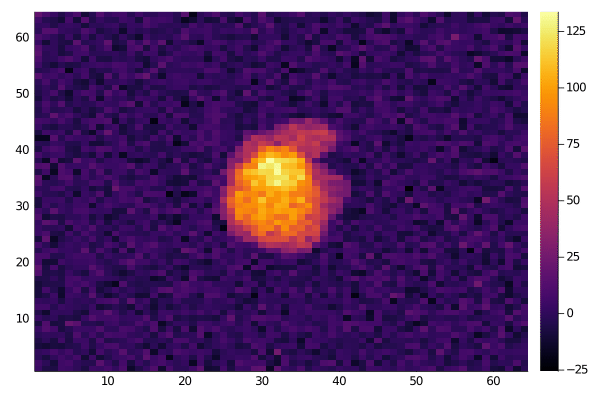

In [9]:
anim = @animate for i in 1:frame_num
    heatmap(frames[i])
end
gif(anim, "afm_output.gif", fps = 10)

In [10]:
# @time result = getafmposteriors_alpha(frames[1, :], model_array[1:2, :], q_array[1:2, :], param_array)

In [11]:
# @time result = getafmposteriors_alpha(frames, model_array, q_array, param_array)

# MDToolbox.outputResults(result, "afm_rotate_test_seed_$(seed_num)_sigma_$(sigma)_frame_num_$(frame_num).txt");